In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
import numpy as np
import torch
import scanpy as sc
import muon as mu
import anndata
import mudata
import pandas as pd

print(anndata.__version__)
print(mudata.__version__)
print(sc.__version__)
print(torch.__version__)

0.8.0
0.2.1
1.9.2
1.11.0


In [4]:
%load_ext autoreload
%autoreload 2

In [3]:
torch.manual_seed(2137)
np.random.seed(2137)

In [4]:
mdata = mu.read('/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/mdata_preprocessed_final_filtered.h5mu')

In [5]:
adata = mdata.mod["rna"]
sc.pp.normalize_total(adata, target_sum=1e4)

In [8]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


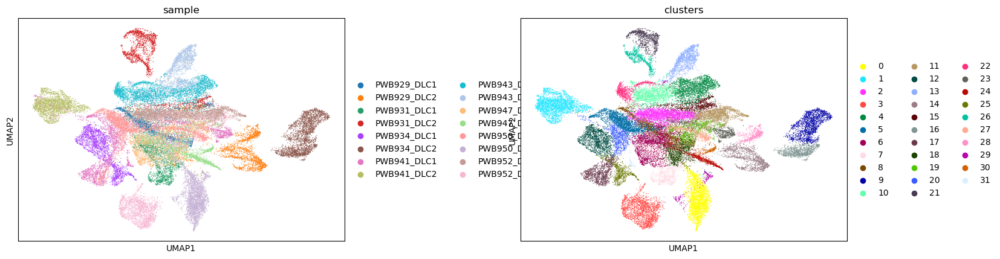

In [49]:
sc.pl.umap(adata, color=["sample", "clusters"], wspace=0.4)

## Harmony

In [9]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, 'sample')

2023-04-23 17:55:10,381 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/threadpoolctl.py:762: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)
2023-04-23 17:55:19,291 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-04-23 17:55:19,411 - harmonypy - INFO - Iteration 1 of 10
2023-04-23 17:55:28,690 - harmonypy - INFO - Iteration 2 of 10
2023-04-23 17:55:37,956 - harmonypy - INFO - Iteration 3 of 10
2023-04-23 17:55:47,272 - harmonypy - INFO - Iteration 4 of 1

In [10]:
adata.obsm["Harmony"] = adata.obsm["X_pca_harmony"]

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


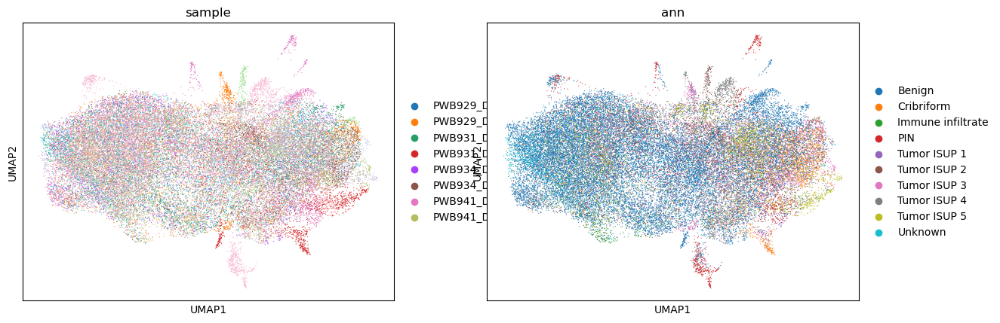

In [51]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_neighbors=30)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=["sample", "ann"],
)

## Metrics

### Unintegrated

In [11]:
sc.tl.pca(adata)
adata.obsm["Unintegrated"] = adata.obsm["X_pca"]

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


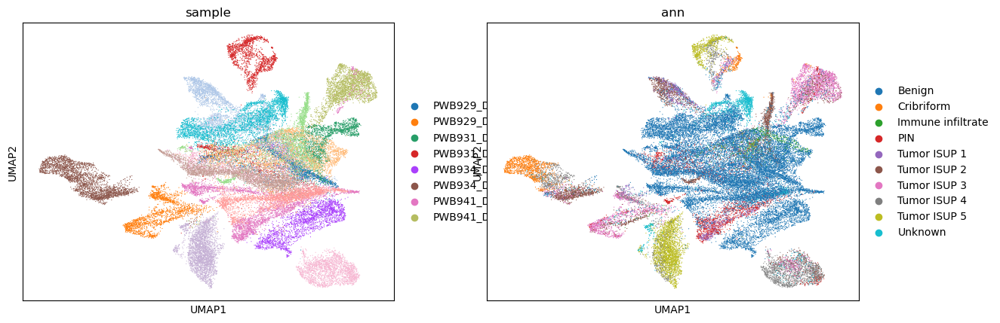

In [12]:
sc.pp.neighbors(adata, use_rep="Unintegrated", n_neighbors=30)
sc.tl.umap(adata)
sc.pl.umap(adata, color=["sample", "ann"])

0.848612399229507


/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


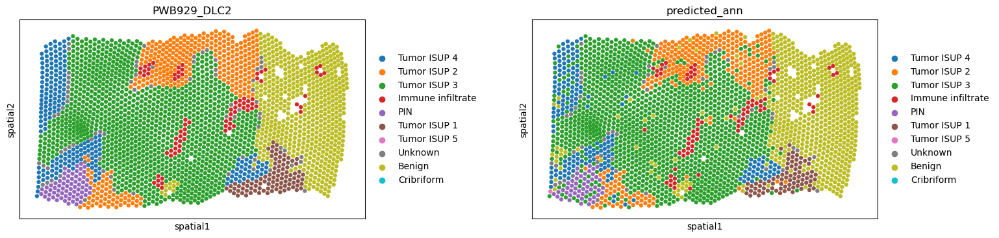

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


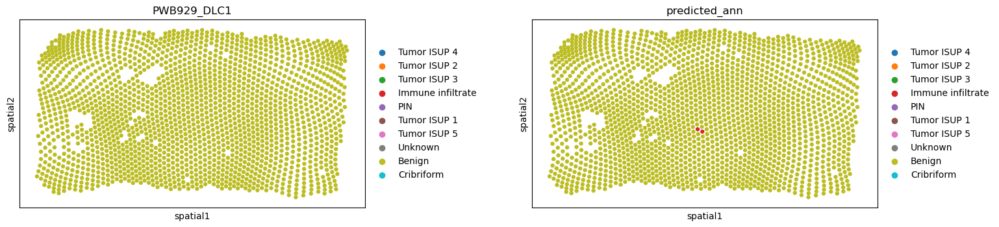

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


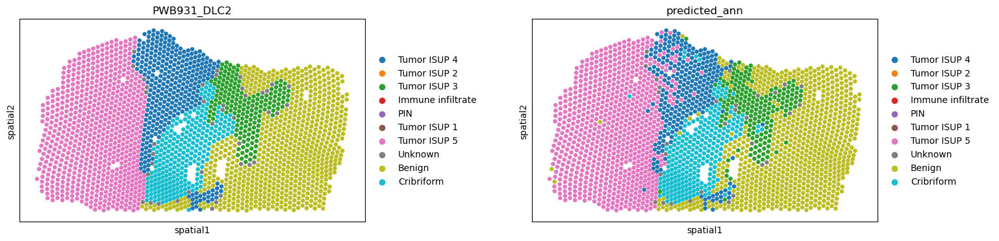

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


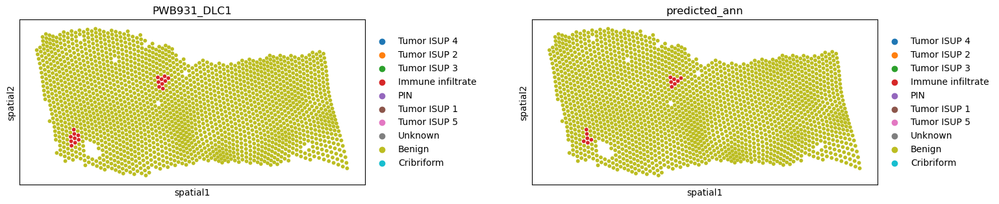

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


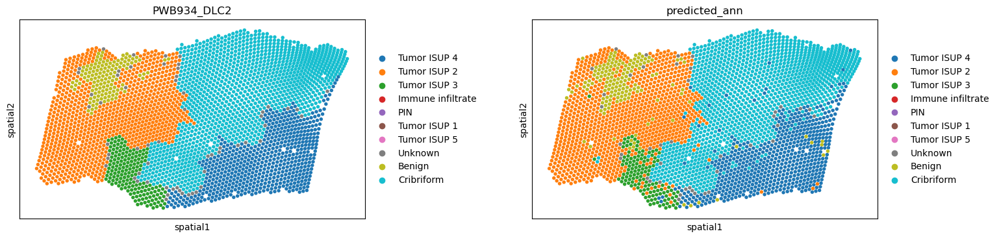

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


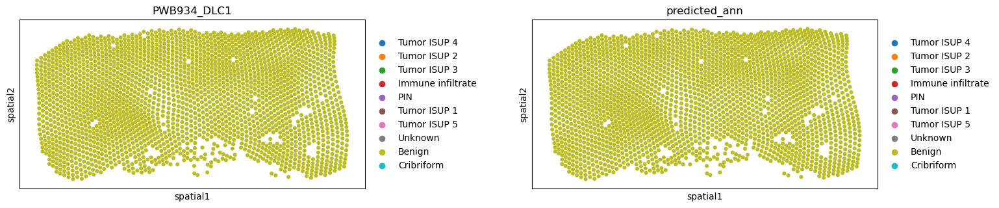

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


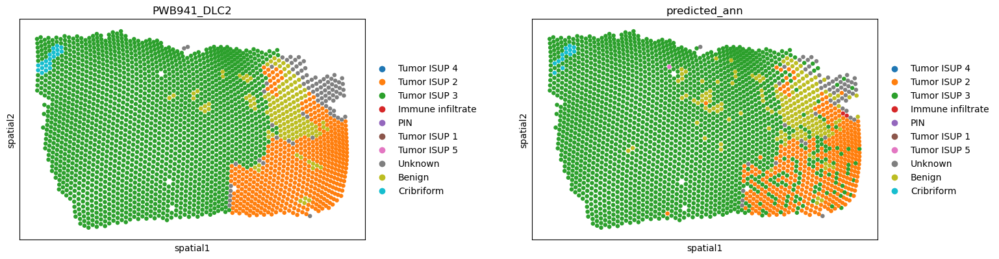

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


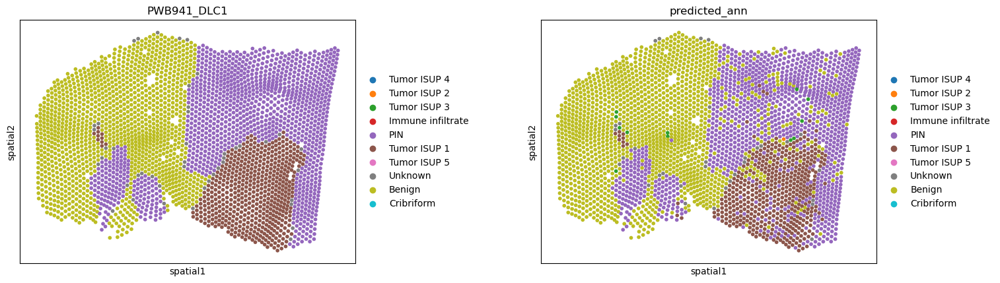

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


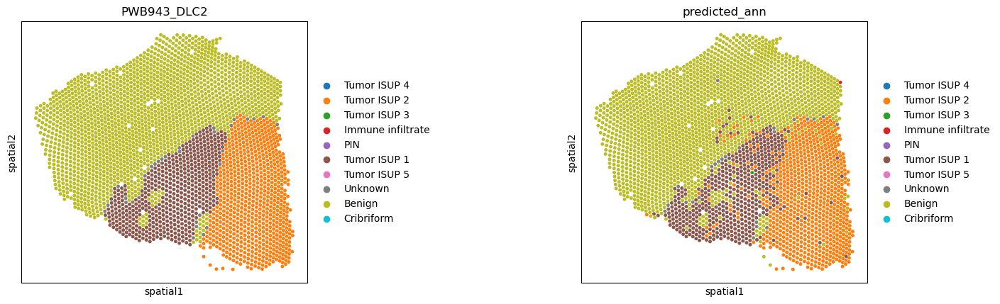

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


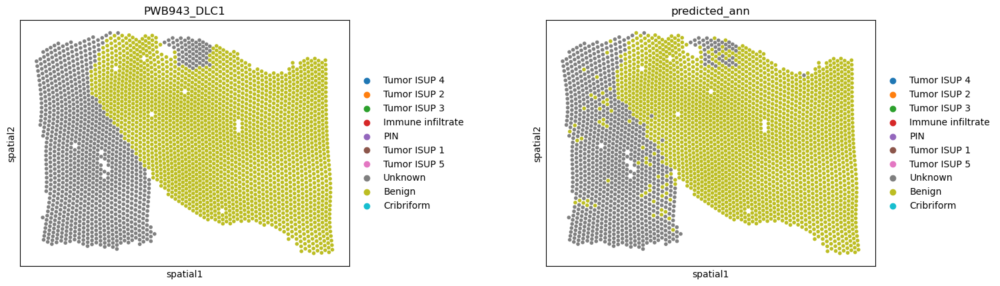

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


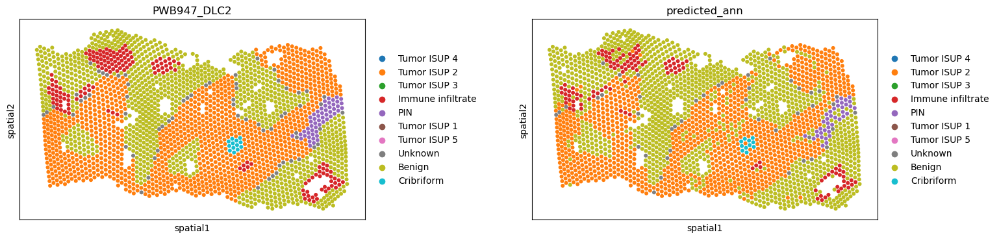

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


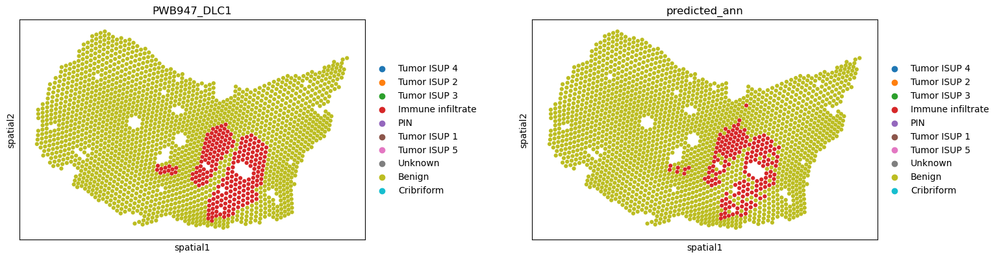

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


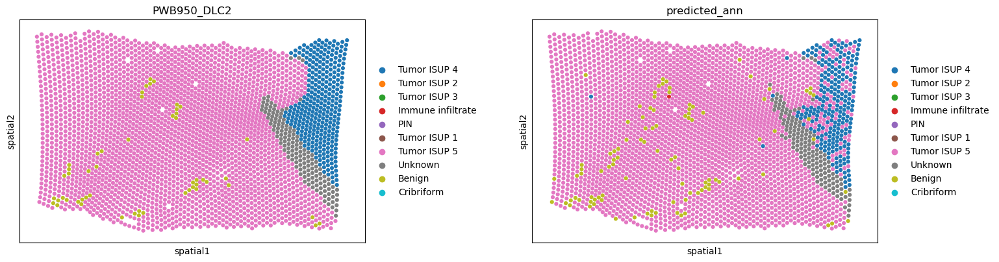

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


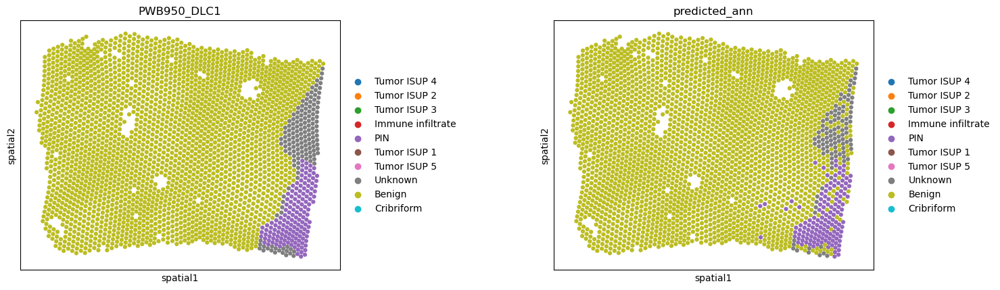

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


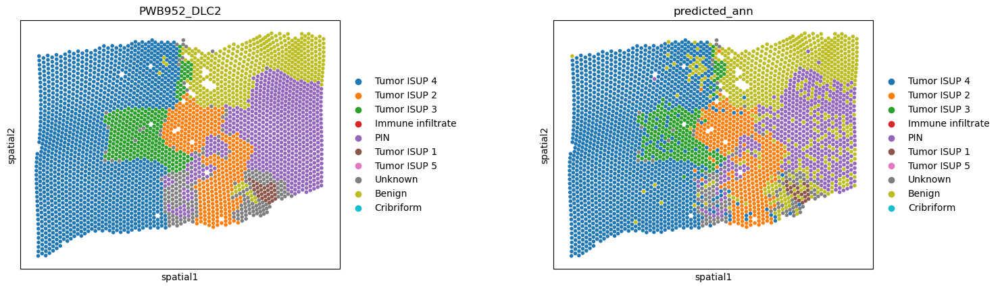

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/diagnostics.py:107: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  mdata_tmp.obs["ann"] = mdata_tmp.obs["ann"].cat.reorder_categories(


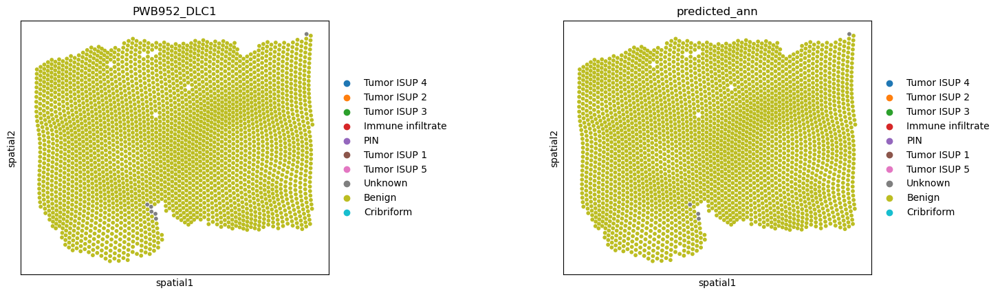

In [97]:
plot_spatial(model, adata, embed_key="Unintegrated")

### scVI

In [6]:
adata_scvi = sc.read("reports/scvi_prostate.h5ad")
adata_scvi

AnnData object with n_obs × n_vars = 42475 × 18950
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'size_factors', 'sample', 'type', 'patient', 'ann', 'tissue', 'imagerow', 'imagecol', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'scVI', 'spatial'
    layers: 'counts', 'scran_normalization', 'spotclean'

In [14]:
adata.obsm["scVI"] = adata_scvi.obsm["scVI"]

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


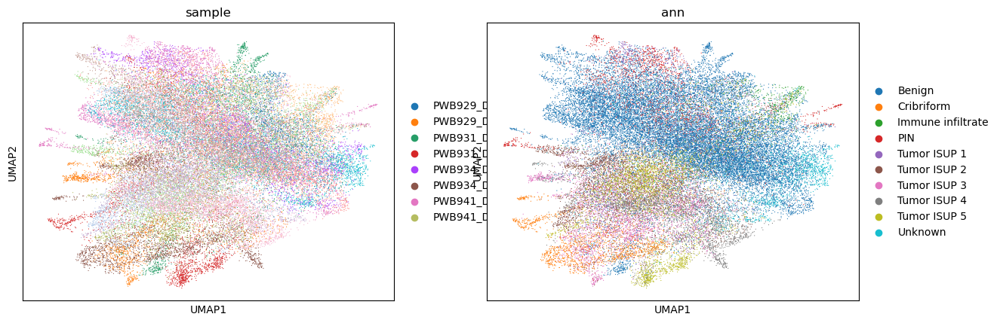

In [14]:
sc.pp.neighbors(adata, use_rep="scVI", n_neighbors=30)
sc.tl.umap(adata)
sc.pl.umap(adata, color=["sample", "ann"])

In [ ]:
plot_spatial(model, adata, embed_key="scVI")

### Harmony

In [ ]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, 'sample')

In [17]:
adata.obsm["Harmony"] = adata.obsm["X_pca_harmony"]

In [ ]:
plot_spatial(model, adata, embed_key="Harmony")

### VAE

In [15]:
from src.types import TrainParams
from src.vae.model import VAE, ModelParams

train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, params_file="prostate_0.01priv")

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
model = VAE(adata, model_params)

model.load_state_dict(torch.load("mvae_params/prostate_0.01priv_20230420-233114.pt"))

<All keys matched successfully>

In [16]:
from src.vae.train import to_latent
emb = to_latent(model, adata, ["sample"], train_params)
adata.obsm["X_vae_0.01"] = np.vstack([x.numpy() for x in emb])

100%|██████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.19it/s]


In [ ]:
plot_spatial(model, adata, embed_key="X_vae_0.01")

In [23]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key="sample",
    label_key="ann",
    embedding_obsm_keys=["Unintegrated", "X_vae_0.01", "Harmony", "scVI"],
    n_jobs=16,
)
bm.benchmark()

Metrics:   0%|                                     | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]WARNING:jax._src.lib.xla_bridge:No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:  60%|██████████████████            | 6/10 [04:43<02:00, 30.25s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          
INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Embeddings: 100%|█████████████████████████████████████████████████████████████| 5/5 [16:58<00:00, 203.74s/it]

                                                                                                             

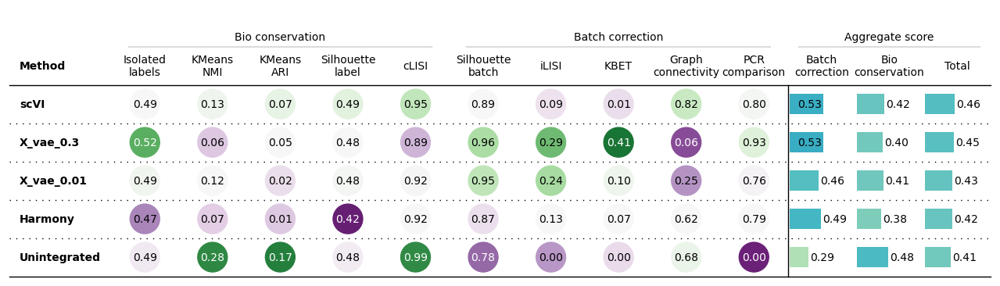

In [24]:
bm.plot_results_table(min_max_scale=False)

## VAE with spatial loss

In [35]:
train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, params_file="prostate_spatial")

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
model = VAE(adata, model_params)

In [18]:
# from src.vae.train import train_vae
# hist = train_vae(model, adata, batch_keys=["sample"], params=train_params)
model = VAE(adata, model_params)
model.load_state_dict(torch.load("mvae_params/prostate_spatial_20230421-220659.pt"))
emb = to_latent(model, adata, ["sample"], train_params)
adata.obsm["X_vae_spatial"] = np.vstack([x.numpy() for x in emb])

100%|██████████████████████████████████████████████████████████████████████| 332/332 [00:15<00:00, 21.31it/s]


100%|██████████████████████████████████████████████████████████████████████| 332/332 [00:21<00:00, 15.25it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


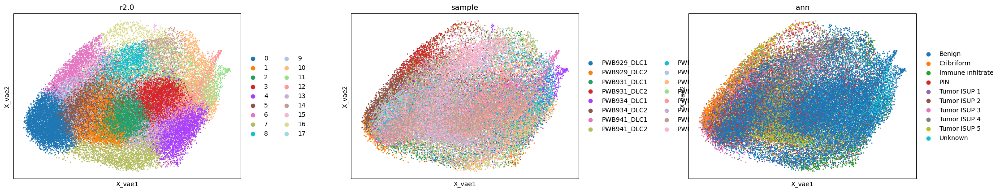

In [60]:
plot_embedding(model, adata, keys=["sample", "ann"], batch_keys=["sample"], leiden_res=2.0, train_params=train_params)

In [ ]:
from src.vae.diagnostics import plot_spatial
plot_spatial(model, adata, embed_key="X_vae")

In [21]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key="sample",
    label_key="ann",
    embedding_obsm_keys=["Unintegrated", "X_vae_0.01", "X_vae_0.3", "X_vae_spatial", "X_vae_spatial_8n", "Harmony", "scVI"],
    n_jobs=16,
)
bm.benchmark()

Metrics:   0%|                                     | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]WARNING:jax._src.lib.xla_bridge:No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)

Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:  60%|██████████████████            | 6/10 [04:30<01:55, 28.90s/it, Batch correction: kbet_per_label]

INFO     Diffusion distance failed. Skip.                                                                          
INFO     Diffusion distance failed. Skip.                                                                          



Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Metrics:   0%|                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                             
Embeddings: 100%|█████████████████████████████████████████████████████████████| 7/7 [25:46<00:00, 220.87s/it]

        

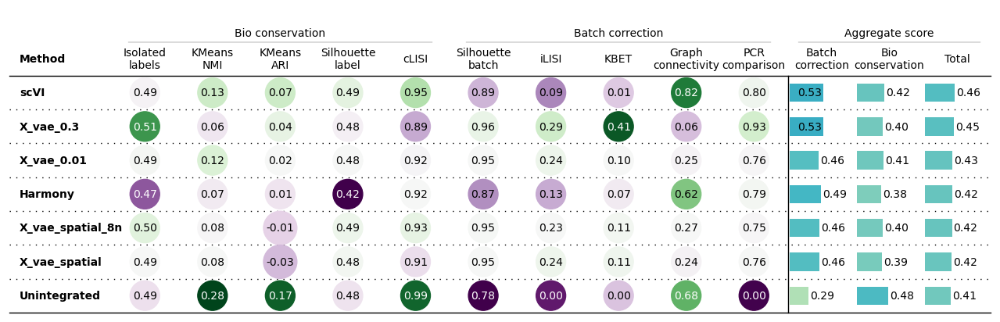

In [22]:
bm.plot_results_table(min_max_scale=False)

In [23]:
from collections import defaultdict
methods = ["Unintegrated", "X_vae_0.01", "X_vae_0.3", "X_vae_spatial_8n", "X_vae_spatial", "Harmony", "scVI"]
class_perf = defaultdict(dict)

In [25]:
from src.vae.diagnostics import classification_performance
for method in methods:
    print(method)
    for sample in adata.obs["sample"].unique():
        class_perf[method][sample] = classification_performance(adata, embed_key=method, loo=sample)[0]

Unintegrated
X_vae_0.01
X_vae_0.3
X_vae_spatial_8n
X_vae_spatial
Harmony
scVI


/tmp/ipykernel_1699714/170998287.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels=ax.get_xticklabels(), rotation=90)


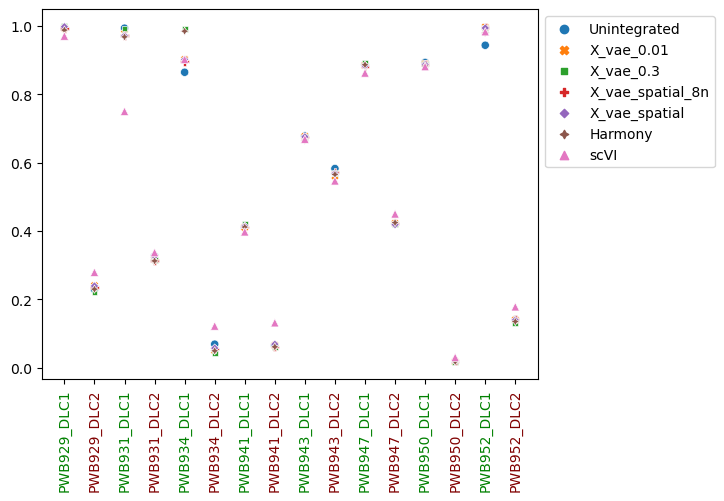

In [26]:
import seaborn as sns
cp = pd.DataFrame(class_perf).sort_index()
tissue = ["normal", "cancer"] * int(len(cp) / 2)
cp["tissue"] = tissue
ax = sns.scatterplot(data=cp)
ax.set_xticklabels(labels=ax.get_xticklabels(), rotation=90)
for tissue, tick_label in zip(tissue, ax.axes.get_xticklabels()):
    if tissue == "cancer":
        tick_label.set_color("maroon")
    else:
        tick_label.set_color("green")

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [27]:
cp.groupby("tissue").mean()

,Unintegrated,X_vae_0.01,X_vae_0.3,X_vae_spatial_8n,X_vae_spatial,Harmony,scVI
tissue,,,,,,,
cancer,0.231531,0.226673,0.222526,0.227681,0.229654,0.224507,0.259303
normal,0.832937,0.841196,0.856239,0.838632,0.840411,0.845641,0.801691
